# Assignment 1. Faster RCNN & YOLOv8

## Train Faster RCNN

References:
- https://github.com/Kirouane-Ayoub/Train-FAster_RCNN-Detectron2

In [ ]:
!pip install --upgrade --no-cache-dir gdown > /dev/null
!gdown 1aJ8Xnz0LuVnIE29FHWWk20GqMrEv7P7c > /dev/null
!unzip IU-S23-AML-Assignment-1.v1i.coco.zip -d coco > /dev/null

Downloading...
From: https://drive.google.com/uc?id=1aJ8Xnz0LuVnIE29FHWWk20GqMrEv7P7c
To: /content/IU-S23-AML-Assignment-1.v1i.coco.zip
100% 34.4M/34.4M [00:02<00:00, 16.4MB/s]


In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git' > /dev/null

  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-fhds9wkj


In [ ]:
import detectron2

import os
import glob

import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, build_detection_test_loader
from detectron2.data.catalog import DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

In [ ]:
register_coco_instances('my_dataset_train', {},
                        'coco/train/_annotations.coco.json', 'coco/train')

register_coco_instances('my_dataset_valid', {},
                        'coco/valid/_annotations.coco.json', 'coco/valid')

register_coco_instances('my_dataset_test', {},
                        'coco/test/_annotations.coco.json', 'coco/test')

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata,
                            scale=0.9)
    
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(
    "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_test",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001

cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2000
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.TEST.EVAL_PERIOD = 500

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/10 15:57:29 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/10 15:57:31 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x/139173657/model_final_68b088.pkl ...


model_final_68b088.pkl: 421MB [00:26, 15.7MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[03/10 15:58:00 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/10 15:59:12 d2.utils.events]:  eta: 1:44:56  iter: 19  total_loss: 5.408  loss_cls: 1.738  loss_box_reg: 0.2966  loss_rpn_cls: 2.865  loss_rpn_loc: 0.623  time: 3.0948  last_time: 3.2659  data_time: 0.0716  last_data_time: 0.0299   lr: 1.931e-06  max_mem: 7237M
[03/10 16:00:14 d2.utils.events]:  eta: 1:43:53  iter: 39  total_loss: 4.792  loss_cls: 1.69  loss_box_reg: 0.2854  loss_rpn_cls: 2.414  loss_rpn_loc: 0.4989  time: 3.0991  last_time: 3.0214  data_time: 0.0222  last_data_time: 0.0118   lr: 2.911e-06  max_mem: 7237M
[03/10 16:01:17 d2.utils.events]:  eta: 1:42:49  iter: 59  total_loss: 4.524  loss_cls: 1.587  loss_box_reg: 0.3072  loss_rpn_cls: 2.101  loss_rpn_loc: 0.5189  time: 3.1009  last_time: 3.2651  data_time: 0.0237  last_data_time: 0.0121   lr: 3.891e-06  max_mem: 7237M
[03/10 16:02:19 d2.utils.events]:  eta: 1:43:14  iter: 79  total_loss: 4.125  loss_cls: 1.489  loss_box_reg: 0.454  loss_rpn_cls: 1.519  loss_rpn_loc: 0.5659  time: 3.1093  last_time: 3.2662  data_time

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/10 16:24:57 d2.utils.events]:  eta: 1:19:54  iter: 519  total_loss: 1.706  loss_cls: 0.5113  loss_box_reg: 0.7137  loss_rpn_cls: 0.07543  loss_rpn_loc: 0.3587  time: 3.0891  last_time: 3.2703  data_time: 0.0279  last_data_time: 0.0248   lr: 2.6431e-05  max_mem: 7237M
[03/10 16:26:00 d2.utils.events]:  eta: 1:18:49  iter: 539  total_loss: 1.586  loss_cls: 0.4912  loss_box_reg: 0.7585  loss_rpn_cls: 0.06566  loss_rpn_loc: 0.2624  time: 3.0913  last_time: 3.2634  data_time: 0.0231  last_data_time: 0.0288   lr: 2.7411e-05  max_mem: 7237M
[03/10 16:27:01 d2.utils.events]:  eta: 1:17:44  iter: 559  total_loss: 1.554  loss_cls: 0.4317  loss_box_reg: 0.6596  loss_rpn_cls: 0.06192  loss_rpn_loc: 0.2843  time: 3.0901  last_time: 2.5490  data_time: 0.0292  last_data_time: 0.0301   lr: 2.8391e-05  max_mem: 7237M
[03/10 16:28:05 d2.utils.events]:  eta: 1:16:40  iter: 579  total_loss: 1.566  loss_cls: 0.4496  loss_box_reg: 0.7225  loss_rpn_cls: 0.06951  loss_rpn_loc: 0.309  time: 3.0929  last_ti

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/10 16:50:46 d2.utils.events]:  eta: 0:52:54  iter: 1019  total_loss: 1.168  loss_cls: 0.2521  loss_box_reg: 0.6362  loss_rpn_cls: 0.03991  loss_rpn_loc: 0.1958  time: 3.0924  last_time: 3.0554  data_time: 0.0236  last_data_time: 0.0353   lr: 5e-05  max_mem: 7237M
[03/10 16:51:47 d2.utils.events]:  eta: 0:51:49  iter: 1039  total_loss: 1.138  loss_cls: 0.2675  loss_box_reg: 0.6146  loss_rpn_cls: 0.03633  loss_rpn_loc: 0.1732  time: 3.0917  last_time: 3.0331  data_time: 0.0266  last_data_time: 0.0185   lr: 5e-05  max_mem: 7237M
[03/10 16:52:46 d2.utils.events]:  eta: 0:50:44  iter: 1059  total_loss: 1.048  loss_cls: 0.219  loss_box_reg: 0.608  loss_rpn_cls: 0.02917  loss_rpn_loc: 0.1784  time: 3.0897  last_time: 3.0528  data_time: 0.0263  last_data_time: 0.0294   lr: 5e-05  max_mem: 7237M
[03/10 16:53:47 d2.utils.events]:  eta: 0:49:39  iter: 1079  total_loss: 1  loss_cls: 0.2205  loss_box_reg: 0.587  loss_rpn_cls: 0.03044  loss_rpn_loc: 0.2019  time: 3.0886  last_time: 3.2426  data_

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/10 17:16:36 d2.utils.events]:  eta: 0:25:56  iter: 1519  total_loss: 0.8136  loss_cls: 0.1397  loss_box_reg: 0.4539  loss_rpn_cls: 0.01898  loss_rpn_loc: 0.1616  time: 3.0948  last_time: 3.2756  data_time: 0.0263  last_data_time: 0.0410   lr: 2.5e-06  max_mem: 7237M
[03/10 17:17:37 d2.utils.events]:  eta: 0:24:51  iter: 1539  total_loss: 0.7804  loss_cls: 0.1777  loss_box_reg: 0.4277  loss_rpn_cls: 0.01826  loss_rpn_loc: 0.146  time: 3.0946  last_time: 3.0500  data_time: 0.0248  last_data_time: 0.0197   lr: 2.5e-06  max_mem: 7237M
[03/10 17:18:38 d2.utils.events]:  eta: 0:23:46  iter: 1559  total_loss: 0.8141  loss_cls: 0.1517  loss_box_reg: 0.4187  loss_rpn_cls: 0.02192  loss_rpn_loc: 0.1778  time: 3.0938  last_time: 3.2555  data_time: 0.0258  last_data_time: 0.0107   lr: 2.5e-06  max_mem: 7237M
[03/10 17:19:40 d2.utils.events]:  eta: 0:22:41  iter: 1579  total_loss: 0.7589  loss_cls: 0.1467  loss_box_reg: 0.4355  loss_rpn_cls: 0.02228  loss_rpn_loc: 0.139  time: 3.0938  last_time

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/10 17:49:19 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


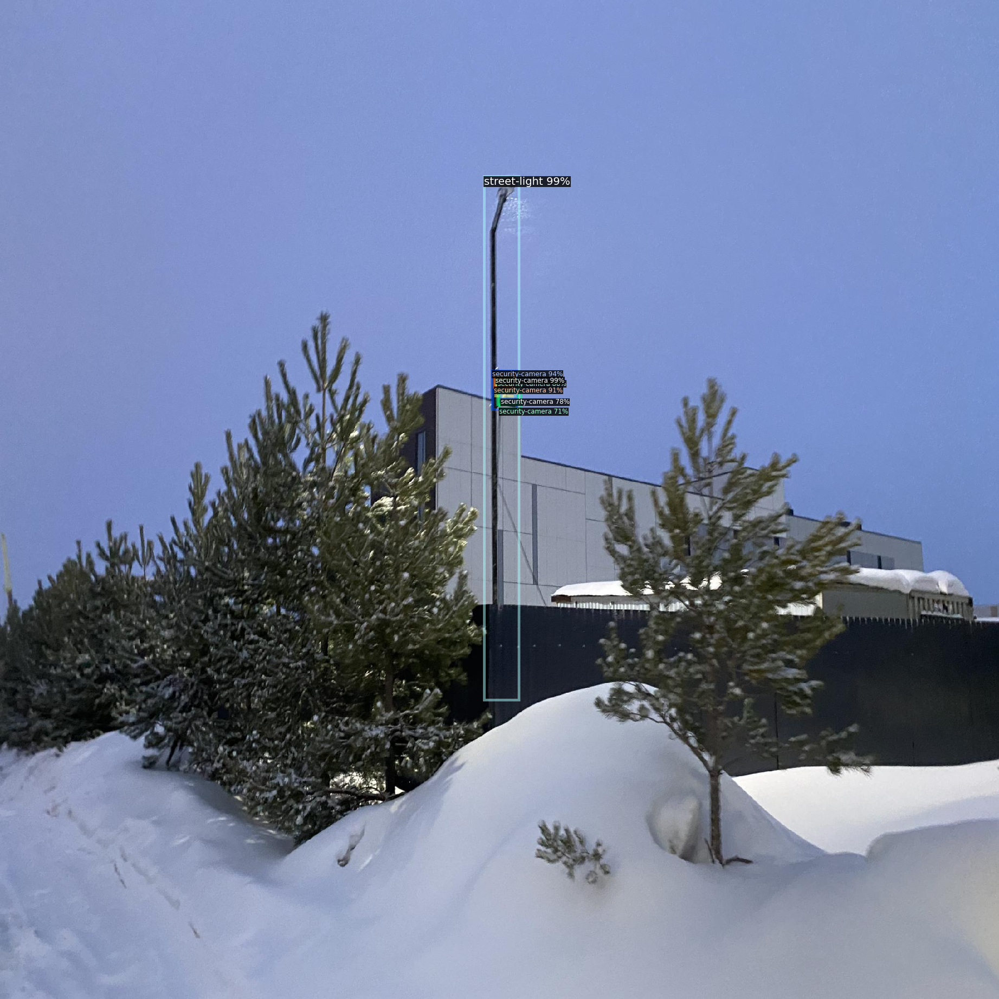

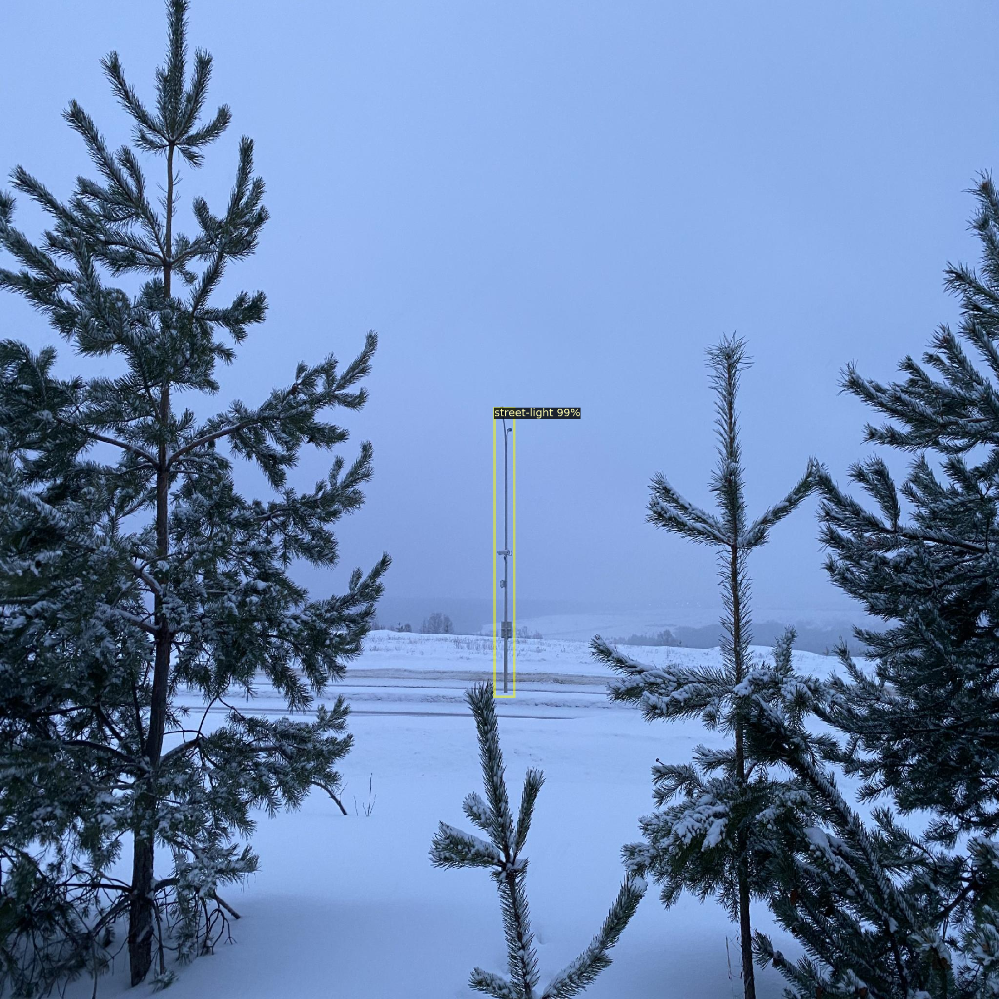

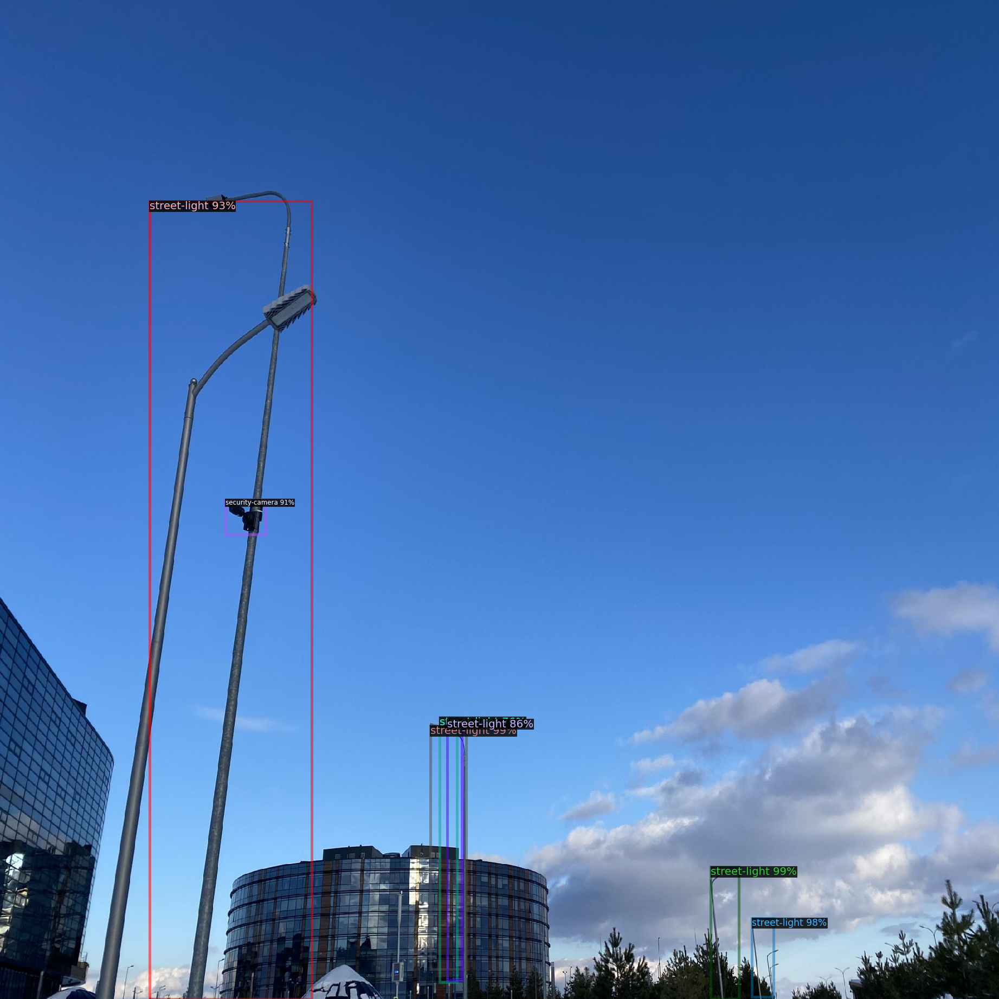

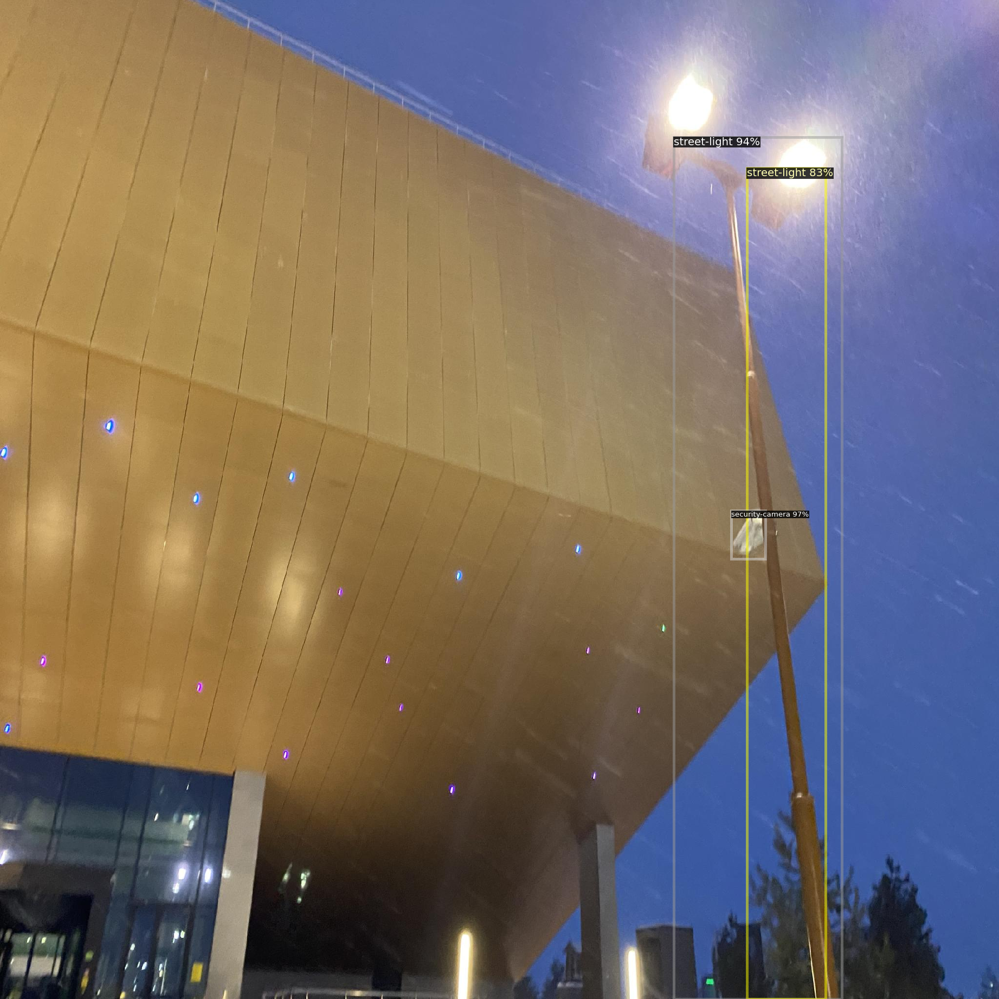

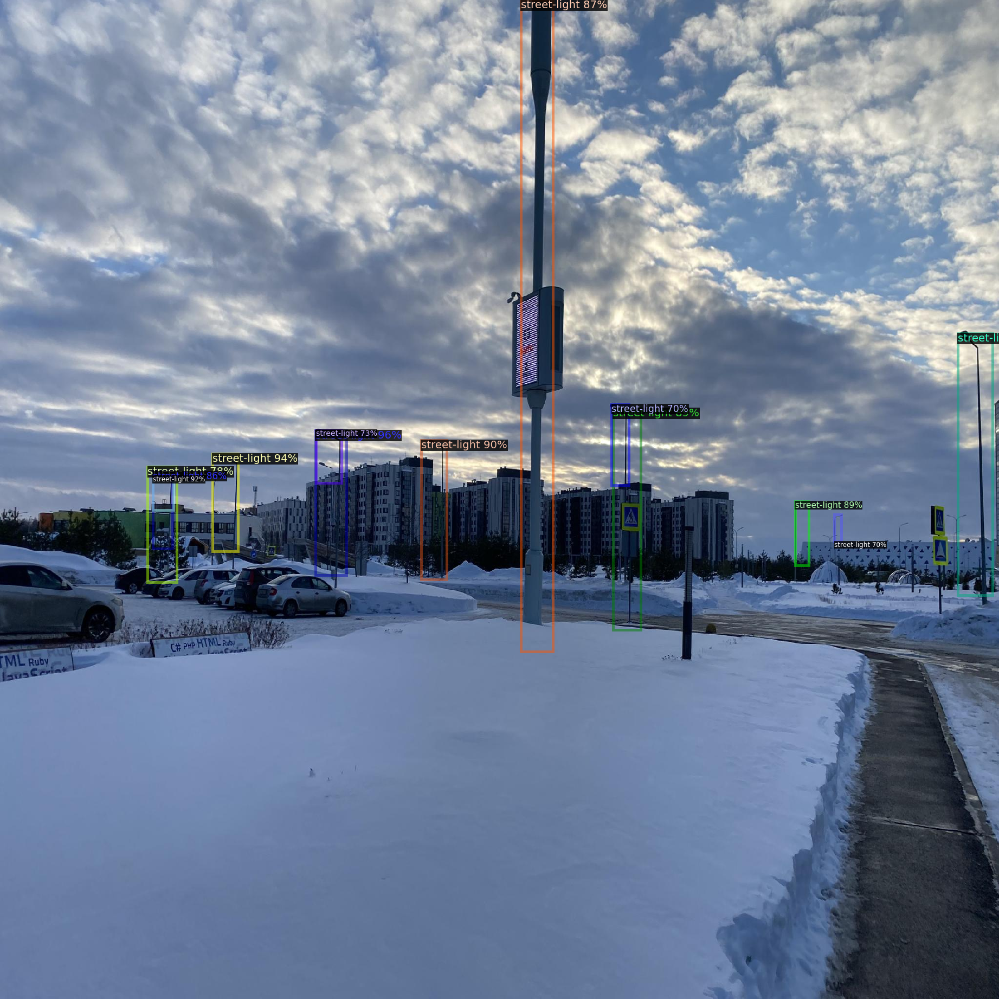

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

for imageName in glob.glob('coco/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.9
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/10 17:43:16 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [03/10 17:43:16 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/10 17:43:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/10 17:43:16 d2.data.datasets.coco]: Loaded 5 images in COCO format from coco/test/_annotations.coco.json
[03/10 17:43:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/10 17:43:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/10 17:43:16 d2.data.common]: Serializing 5 elements to byte tensors and concatenating them all ...
[03/10 17:43:16 d2.data.common]: Serialized dataset takes 0.00 M

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[03/10 17:43:18 d2.evaluation.evaluator]: Total inference time: 0:00:00.336132 (0.336132 s / iter per device, on 1 devices)
[03/10 17:43:18 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.183516 s / iter per device, on 1 devices)
[03/10 17:43:18 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/10 17:43:18 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[03/10 17:43:18 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[03/10 17:43:18 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[03/10 17:43:18 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[03/10 17:43:18 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[03/10 17:43:18 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP)

OrderedDict([('bbox',
              {'AP': 20.8149375421853,
               'AP50': 50.45759460042417,
               'AP75': 11.404075190127708,
               'APs': 0.0,
               'APm': 22.90876944837341,
               'APl': 43.922974555520064,
               'AP-streetlights-securitycameras': nan,
               'AP-security-camera': 14.25082508250825,
               'AP-street-light': 27.37905000186236})])

## Train YOLOv8

In [1]:
!pip install --upgrade --no-cache-dir gdown > /dev/null
!gdown 1rnr_wIz9ywD1j1Cb6XlS3N9UEbQC62zW > /dev/null
!unzip IU-S23-AML-Assignment-1.v1i.yolov8.zip -d yolov8 > /dev/null

Downloading...
From: https://drive.google.com/uc?id=1rnr_wIz9ywD1j1Cb6XlS3N9UEbQC62zW
To: /content/IU-S23-AML-Assignment-1.v1i.yolov8.zip
100% 34.3M/34.3M [00:00<00:00, 142MB/s]


In [3]:
!pip install ultralytics > /dev/null
from ultralytics import YOLO

In [5]:
model = YOLO('yolov8n.pt')
results = model.train(data='/content/yolov8/data.yaml', epochs=25)

Ultralytics YOLOv8.0.52 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yolov8/data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify

  0%|          | 0.00/755k [00:00<?, ?B/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.Conv                  [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.Conv                  [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.C2f                   [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.Conv                  [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.C2f                   [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.Conv                  [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.C2f                   [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

## Convert images from HEIC to JPG

In [ ]:
!pip install --upgrade --no-cache-dir gdown
!gdown 1PkN7XIW4v4CTZ89-HxVwm_8KYMDvoxg2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0
Downloading...
From: https://drive.google.com/uc?id=1PkN7XIW4v4CTZ89-HxVwm_8KYMDvoxg2
To: /content/street-lights-and-security-cameras-heic.zip
100% 268M/268M [01:00<00:00, 4.44MB/s]


In [ ]:
!apt install libheif-examples

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  libheif-examples
0 upgraded, 1 newly installed, 0 to remove and 22 not upgraded.
Need to get 30.7 kB of archives.
After this operation, 136 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 libheif-examples amd64 1.6.1-1build1 [30.7 kB]
Fetched 30.7 kB in 0s (127 kB/s)
Selecting previously unselected package libheif-examples.
(Reading database ... 128215 files and directories currently installed.)
Preparing to unpack .../libheif-examples_1.6.1-1build1_amd64.deb ...
Unpacking libheif-examples (1.6.1-1build1) ...
Setting up libheif-examples (1.6.1-1build1) ...
Processing triggers for man-db (2.9.1-1) ...


In [ ]:
%%shell
unzip street-lights-and-security-cameras-heic.zip

for file in street-lights-and-security-cameras-heic/*.HEIC
do
    heif-convert $file ${file/%.HEIC/.jpg}
done

mkdir -p street-lights-and-security-cameras-jpg
mv -f street-lights-and-security-cameras-heic/*.jpg \
    street-lights-and-security-cameras-jpg

zip -r street-lights-and-security-cameras-jpg.zip \
    street-lights-and-security-cameras-jpg

Archive:  street-lights-and-security-cameras-heic.zip
   creating: street-lights-and-security-cameras-heic/
  inflating: street-lights-and-security-cameras-heic/IMG_0507.HEIC  
  inflating: __MACOSX/street-lights-and-security-cameras-heic/._IMG_0507.HEIC  
  inflating: street-lights-and-security-cameras-heic/IMG_0550.HEIC  
  inflating: __MACOSX/street-lights-and-security-cameras-heic/._IMG_0550.HEIC  
  inflating: street-lights-and-security-cameras-heic/IMG_0679.HEIC  
  inflating: __MACOSX/street-lights-and-security-cameras-heic/._IMG_0679.HEIC  
  inflating: street-lights-and-security-cameras-heic/IMG_0546.HEIC  
  inflating: __MACOSX/street-lights-and-security-cameras-heic/._IMG_0546.HEIC  
  inflating: street-lights-and-security-cameras-heic/IMG_0680.HEIC  
  inflating: __MACOSX/street-lights-and-security-cameras-heic/._IMG_0680.HEIC  
  inflating: street-lights-and-security-cameras-heic/IMG_0511.HEIC  
  inflating: __MACOSX/street-lights-and-security-cameras-heic/._IMG_0511.HEIC 